# Natural Language Processing - F24

This project is a classification task on 5000 wikipedia topics using spacy and ANN classifiers.

the data extraction was done first using beautiful soup. The topics with more than 200 links were selected.

After that the data cleaning was done using spacy. This was by removing of punctuation, stop words, links, emails, lower casing and lemmetization.


the models were trained using diffrent hyyper parameters like epochs, and batch size. the output was evaluated using Confusion metrix, percision, recall and F1 score on testset.

# Library loading

In [1]:
import spacy
import requests
from bs4 import BeautifulSoup
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import random
from spacy.util import minibatch
from spacy.training.example import Example
from sklearn.metrics import confusion_matrix

In [2]:
!spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


# Data preparation

This section contains alot of data scraping part to get text from wikipedia. first the categpries were fetched, after that the subtopics and their links, then finally the actual topic pages.


during each step the data was saved to make sure that we don't lose the outputs and to avoid multiple scraping requests.


In [ ]:
url = "https://en.wikipedia.org/wiki/Wikipedia:Contents/Categories#General_reference"
response = requests.get(url)
html_content = response.text
topics_page = BeautifulSoup(html_content, 'html.parser')

In [ ]:
containers = []
for container in topics_page.find_all('div', class_='contentsPage__section'):
    containers.append(container)

In [ ]:
topics = {}
for container in containers:
    topic = container.findAll('li')
    #print(topic)
    for i in topic:
        #print(i.findAll('a'))
        for link in i.findAll('a'):
            topics[link.text] = 'https://en.wikipedia.org' + link['href']
topics

{'The topmost category': 'https://en.wikipedia.org/wiki/Category:Contents',
 'List of all categories': 'https://en.wikipedia.org/wiki/Special:Categories',
 "About Wikipedia's categories": 'https://en.wikipedia.org/wiki/Wikipedia:Category',
 'Category help': 'https://en.wikipedia.org/wiki/Help:Category',
 'Random category': 'https://en.wikipedia.org/wiki/Special:Random/Category',
 'Reference works': 'https://en.wikipedia.org/wiki/Category:Reference_works',
 'Almanacs': 'https://en.wikipedia.org/wiki/Category:Almanacs',
 'Atlases': 'https://en.wikipedia.org/wiki/Category:Atlases',
 'Biographical dictionaries': 'https://en.wikipedia.org/wiki/Category:Biographical_dictionaries',
 'Dictionaries': 'https://en.wikipedia.org/wiki/Category:Dictionaries',
 'online': 'https://en.wikipedia.org/wiki/Category:Online_databases',
 'Directories': 'https://en.wikipedia.org/wiki/Category:Directories',
 'Encyclopedias': 'https://en.wikipedia.org/wiki/Category:Encyclopedias',
 'Glossaries': 'https://en.wik

In [ ]:
del topics['The topmost category']
del topics['List of all categories']
del topics["About Wikipedia's categories"]
del topics["Category help"]
del topics["Random category"]
del topics["Reference works"]
counter = 0
for topic in topics.keys():
    counter +=1
print(counter)

685


In [ ]:
import json
with open('topics.json', 'w') as f:
  json.dump(topics, f)

In [ ]:
import random

random_topics = random.sample(list(topics.keys()),100)
random_topics
random_links = {topic: topics[topic] for topic in random_topics}
random_links

{'Psychotherapy': 'https://en.wikipedia.org/wiki/Category:Psychotherapy',
 'Occupational safety and health': 'https://en.wikipedia.org/wiki/Category:Occupational_safety_and_health',
 'Optoelectronics': 'https://en.wikipedia.org/wiki/Category:Optoelectronics',
 'online': 'https://en.wikipedia.org/wiki/Category:Online_databases',
 'Calculus': 'https://en.wikipedia.org/wiki/Category:Calculus',
 'Pets': 'https://en.wikipedia.org/wiki/Category:Pets',
 'Personal life': 'https://en.wikipedia.org/wiki/Category:Personal_life',
 'Mathematical analysis': 'https://en.wikipedia.org/wiki/Category:Mathematical_analysis',
 'Billionaires': 'https://en.wikipedia.org/wiki/Category:Billionaires',
 'Earthquake engineering': 'https://en.wikipedia.org/wiki/Category:Earthquake_engineering',
 'Slaves': 'https://en.wikipedia.org/wiki/Category:Slaves',
 'Search engines': 'https://en.wikipedia.org/wiki/Category:Internet_search_engines',
 'Men': 'https://en.wikipedia.org/wiki/Category:Men',
 'Real estate': 'https:

In [ ]:
topics_pages = {}
for topic in random_links.keys():
    url = topics[topic]
    response = requests.get(url)
    html_content = response.text
    topics_pages[topic] = BeautifulSoup(html_content, 'html.parser')
topics_pages

{'Psychotherapy': <!DOCTYPE html>
 
 <html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-disabled vector-feature-custom-font-size-clientpref--excluded vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-toc-not-available" dir="ltr" lang="en">
 <head>
 <meta charset="utf-8"/>
 <title>Category:Psychotherapy - Wikipedia</title>
 <script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vect

In [ ]:
import json
with open('/content/categories_and_pages.json', 'r') as f:
  categories_and_pages = json.load(f)

In [ ]:
final_topics_dict = []
for category in categories_and_pages.keys():
    for page in categories_and_pages[category]:
        for k in page.keys():
            data = {'Category': category, 'Topic': k, 'Link': page[k]}
            final_topics_dict.append(data)
with open('final_topics_dict.json', 'w') as f:
  json.dump(final_topics_dict, f)

In [ ]:
import pandas as pd
data = pd.DataFrame(final_topics_dict)
data

,Category,Topic,Link
0,Almanacs,This list may not reflect recent changes,https://en.wikipedia.org/wiki/Wikipedia:FAQ/Ca...
1,Almanacs,Almanac,https://en.wikipedia.org/wiki/Almanac
2,Almanacs,List of almanacs,https://en.wikipedia.org/wiki/List_of_almanacs
3,Almanacs,Almanac of American Philanthropy,https://en.wikipedia.org/wiki/Almanac_of_Ameri...
4,Almanacs,The Almanac of American Politics,https://en.wikipedia.org/wiki/The_Almanac_of_A...
...,...,...,...
41947,Technology timelines,Timeline of the introduction of color televisi...,https://en.wikipedia.org/wiki/Timeline_of_the_...
41948,Technology timelines,Timeline of the introduction of radio in count...,https://en.wikipedia.org/wiki/Timeline_of_the_...
41949,Technology timelines,Timeline of the introduction of television in ...,https://en.wikipedia.org/wiki/Timeline_of_the_...
41950,Technology timelines,Timeline of United States inventions,https://en.wikipedia.org/wiki/Timeline_of_Unit...


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

<Axes: xlabel='Category', ylabel='count'>

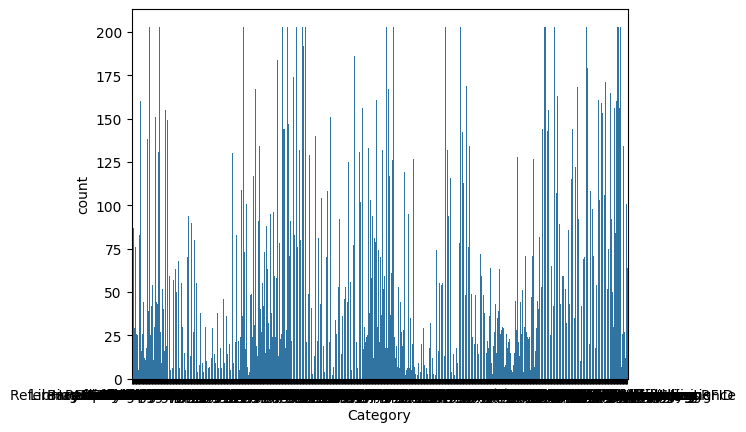

In [ ]:
sns.countplot(x='Category', data=data)

# Data selection

based on the fetched topics under the categories. The Categories selected are the ones with more 200 links

In [ ]:
#will filter categories with more than 200 topics so we can fetch them
categories_and_pages_filtered = {}
for category in categories_and_pages.keys():
    if len(categories_and_pages[category]) > 200:
        categories_and_pages_filtered[category] = categories_and_pages[category]

with open('categories_and_pages_filtered.json', 'w') as f:
  json.dump(categories_and_pages_filtered, f)

In [ ]:
counter = 0
for category in categories_and_pages_filtered.keys():
    counter +=1
print(counter)

29


In [ ]:
cats_with_200_pages = []
for category in categories_and_pages_filtered.keys():
  for page in categories_and_pages_filtered[category]:
    for k in page.keys():
      data_pt = {'Category': category, 'Topic': k, 'Link': page[k]}
      cats_with_200_pages.append(data_pt)
len(cats_with_200_pages)
with open('cats_with_200_pages.json', 'w') as f:
  json.dump(cats_with_200_pages, f)

In [ ]:
df = pd.DataFrame(cats_with_200_pages)
df

,Category,Topic,Link
0,online,This list may not reflect recent changes,https://en.wikipedia.org/wiki/Wikipedia:FAQ/Ca...
1,online,next page,https://en.wikipedia.org/w/index.php?title=Cat...
2,online,List of online databases,https://en.wikipedia.org/wiki/List_of_online_d...
3,online,Online database,https://en.wikipedia.org/wiki/Online_database
4,online,AgBiotechNet,https://en.wikipedia.org/wiki/AgBiotechNet
...,...,...,...
5880,Systems engineering,Teleforce,https://en.wikipedia.org/wiki/Teleforce
5881,Systems engineering,Terraform (software),https://en.wikipedia.org/wiki/Terraform_(softw...
5882,Systems engineering,Test and evaluation master plan,https://en.wikipedia.org/wiki/Test_and_evaluat...
5883,Systems engineering,Traceability,https://en.wikipedia.org/wiki/Traceability


In [ ]:
df.describe()

,Category,Topic,Link
count,5885,5885,5885
unique,29,5666,5693
top,online,next page,https://en.wikipedia.org/wiki/Wikipedia:FAQ/Ca...
freq,203,56,29


I remoed any duplicated here

In [ ]:
df_unique = df[~df['Topic'].duplicated(keep=False)]

In [ ]:
df_unique.describe()

,Category,Topic,Link
count,5534,5534,5534
unique,29,5534,5534
top,Grammar,List of online databases,https://en.wikipedia.org/wiki/List_of_online_d...
freq,200,1,1


# Plot to show the dataset distribution. (Pages per category)

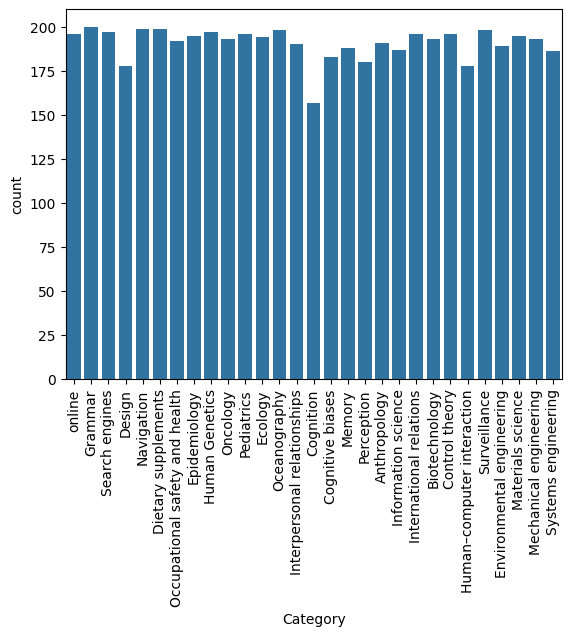

In [ ]:
sns.countplot(x='Category', data=df_unique)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#now fetching all these links
import time
articles_dict = []
i = 0
with open('articles_dict.json', 'w') as f:
  f.write('[\n')
  for row in df_unique.iterrows():
    pt = {'Category': row[1]['Category'], 'Topic': row[1]['Topic'], 'Link': row[1]['Link']}
    url = row[1]['Link']
    response = requests.get(url)
    html_content = response.text
    soup = BeautifulSoup(html_content, 'html.parser')
    pt['soup'] = str(soup)
    if i != 0:
      f.write(',\n')
    json.dump(pt, f)
    #articles_dict.append(pt)
    #print(articles_dict)
    #print(soup.title.text)
    #print(row[1]['Category'])
    #print(row[1]['Topic'])
    #print(row[1]['Link'])
    #print(soup)

    if i % 10 == 0:
      time.sleep(0.5)
    i += 1
  f.write('\n]')
print('done with writing file')

done with writing file


In [ ]:
!pip install ijson

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 3.2 MB/s eta 0:00:00


In [ ]:
import ijson


with open('articles_dict.json', 'r') as read_file, open('articles_final_data.json', 'w') as write_file,  open('articles_final_data_withsoup.json', 'w') as  withsoup:
    write_file.write('[\n')
    withsoup.write('[\n')
    parser = ijson.items(read_file, 'item')
    for i, item in enumerate(parser):
        paragraphs = BeautifulSoup(item['soup'], 'html.parser').find_all('p')
        paras = []
        for paragraph in paragraphs:
          paras.append(paragraph.text)
        item['paragraphs'] = ' '.join(paras)
        json.dump(item, write_file)
        del item['soup']
        json.dump(item, withsoup)
        if i != 0:
          write_file.write(',\n')
          withsoup.write(',\n')
    write_file.write('\n]')
    withsoup.write('\n]')


In [ ]:
with open('articles_final_data_withoutsoup.json', 'r') as f:
  json_text = json.loads(f.read())

In [ ]:
data = pd.read_json('articles_final_data_withoutsoup.json')
data

,Category,Topic,Link,paragraphs
0,online,List of online databases,https://en.wikipedia.org/wiki/List_of_online_d...,\n This is a list of online databases accessib...
1,online,Online database,https://en.wikipedia.org/wiki/Online_database,An online database is a database accessible fr...
2,online,AgBiotechNet,https://en.wikipedia.org/wiki/AgBiotechNet,AgBiotechNet is a searchable online database o...
3,online,Airliners.net,https://en.wikipedia.org/wiki/Airliners.net,"Airliners.net is a Canadian-owned, Australian-..."
4,online,American Council of Learned Societies,https://en.wikipedia.org/wiki/American_Council...,\n The American Council of Learned Societies (...
...,...,...,...,...
5529,Systems engineering,Technical peer review,https://en.wikipedia.org/wiki/Technical_peer_r...,"In engineering, technical peer review is a wel..."
5530,Systems engineering,Teleforce,https://en.wikipedia.org/wiki/Teleforce,Teleforce is a proposed defensive weapon by Ni...
5531,Systems engineering,Terraform (software),https://en.wikipedia.org/wiki/Terraform_(softw...,\n Terraform is an infrastructure-as-code soft...
5532,Systems engineering,Test and evaluation master plan,https://en.wikipedia.org/wiki/Test_and_evaluat...,Test and evaluation master plan (TEMP) is a cr...


In [ ]:
nlp = spacy.load('en_core_web_lg')

In [ ]:
data['text_length'] = data['paragraphs'].str.len()
data

,Category,Topic,Link,paragraphs,text_length
0,online,List of online databases,https://en.wikipedia.org/wiki/List_of_online_d...,\n This is a list of online databases accessib...,66
1,online,Online database,https://en.wikipedia.org/wiki/Online_database,An online database is a database accessible fr...,1154
2,online,AgBiotechNet,https://en.wikipedia.org/wiki/AgBiotechNet,AgBiotechNet is a searchable online database o...,631
3,online,Airliners.net,https://en.wikipedia.org/wiki/Airliners.net,"Airliners.net is a Canadian-owned, Australian-...",3602
4,online,American Council of Learned Societies,https://en.wikipedia.org/wiki/American_Council...,\n The American Council of Learned Societies (...,9920
...,...,...,...,...,...
5529,Systems engineering,Technical peer review,https://en.wikipedia.org/wiki/Technical_peer_r...,"In engineering, technical peer review is a wel...",3032
5530,Systems engineering,Teleforce,https://en.wikipedia.org/wiki/Teleforce,Teleforce is a proposed defensive weapon by Ni...,6306
5531,Systems engineering,Terraform (software),https://en.wikipedia.org/wiki/Terraform_(softw...,\n Terraform is an infrastructure-as-code soft...,2455
5532,Systems engineering,Test and evaluation master plan,https://en.wikipedia.org/wiki/Test_and_evaluat...,Test and evaluation master plan (TEMP) is a cr...,4515


# distribution of the length of paragraphs

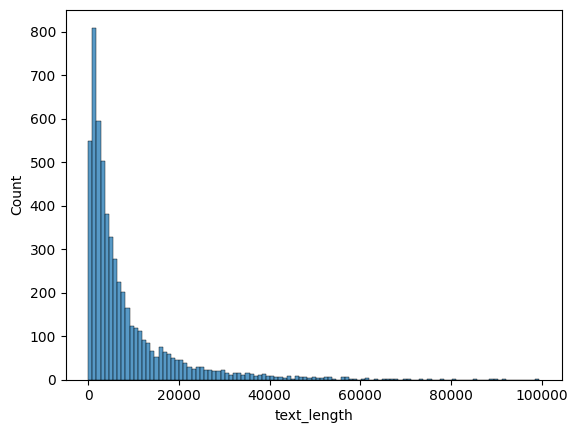

In [ ]:
sns.histplot(data['text_length'])
plt.show()

# Data Cleaning and Preprocessing

this part includes lower casing, removal of punctuation, removal of stop words, removal of links, removal of emails and using lemmetization

In [ ]:
nlp = spacy.load('en_core_web_lg')

In [ ]:
docs = []
#majing npl docs and lowering the case
for i, row in data.iterrows():
  doc = nlp(row['paragraphs'].lower())
  docs.append(doc)

In [ ]:
cleaned_docs = []
cleaned_docs_ents = []
for doc in docs:
  cleaned_doc = []
  cleaned_doc_ents = []
  for token in doc:
    if not token.is_stop and not token.is_punct and not token.is_space and not token.like_url and not token.like_email and token.is_alpha:
      cleaned_doc.append(token.lemma_)
      if token.ent_type_ != '':
        cleaned_doc_ents.append(token.text)
  cleaned_docs.append(' '.join(cleaned_doc))
  cleaned_docs_ents.append(' '.join(cleaned_doc_ents))

In [ ]:
print(len(cleaned_docs))
print(len(cleaned_docs_ents))

5534
5534


In [ ]:
cleaned_docs_ents[:10]

['',
 'monthly lamar smith',
 'agbiotechnet january michigan state university',
 'canadian australian swedish swede johan lundgren johan lundgren luleå university technology sweden lundgren july lundgren year years ago june february verticalscope june million billion june aviation',
 'acls social sciences united states union académique internationale international union acls acls acls acls acls million united states acls united states late hans wehr english arabic acls cao frederic ogg american political science association ernest burgess american american sociological association acls world war ii acls social science research council african asian latin american west european acls committee native american franz boas edward sapir indian richard mckeon arthur oncken lovejoy lovejoy ralph bunche acls acls commission acls acls sponsored national enquiry johns hopkins university press washington today acls humanities e book acls union académique internationale acls american council counci

# adding data to df

In [ ]:
data['clean text'] = cleaned_docs
data['ents'] = cleaned_docs_ents
data

NameError: name 'cleaned_docs' is not defined

# Creating a classifier in spacy

In [3]:
data = pd.read_csv('data_cleaned.csv')
data

,Category,Topic,Link,paragraphs,text_length,clean text,ents
0,online,List of online databases,https://en.wikipedia.org/wiki/List_of_online_d...,\n This is a list of online databases accessib...,66,list online database accessible internet,NaN
1,online,Online database,https://en.wikipedia.org/wiki/Online_database,An online database is a database accessible fr...,1154,online database database accessible local netw...,monthly lamar smith
2,online,AgBiotechNet,https://en.wikipedia.org/wiki/AgBiotechNet,AgBiotechNet is a searchable online database o...,631,agbiotechnet searchable online database scient...,agbiotechnet january michigan state university
3,online,Airliners.net,https://en.wikipedia.org/wiki/Airliners.net,"Airliners.net is a Canadian-owned, Australian-...",3602,canadian own australian global aviation websit...,canadian australian swedish swede johan lundgr...
4,online,American Council of Learned Societies,https://en.wikipedia.org/wiki/American_Council...,\n The American Council of Learned Societies (...,9920,american council learn society acls private no...,acls social sciences united states union acadé...
...,...,...,...,...,...,...,...
5529,Systems engineering,Technical peer review,https://en.wikipedia.org/wiki/Technical_peer_r...,"In engineering, technical peer review is a wel...",3032,engineering technical peer review define revie...,cmmi
5530,Systems engineering,Teleforce,https://en.wikipedia.org/wiki/Teleforce,Teleforce is a proposed defensive weapon by Ni...,6306,teleforce propose defensive weapon nikola tesl...,teleforce nikola van de graaff teleforce trill...
5531,Systems engineering,Terraform (software),https://en.wikipedia.org/wiki/Terraform_(softw...,\n Terraform is an infrastructure-as-code soft...,2455,terraform infrastructure code software tool cr...,hashicorp hashicorp configuration language hcl...
5532,Systems engineering,Test and evaluation master plan,https://en.wikipedia.org/wiki/Test_and_evaluat...,Test and evaluation master plan (TEMP) is a cr...,4515,test evaluation master plan temp critical aspe...,moe square meter moes australian department


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5534 entries, 0 to 5533
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Category     5534 non-null   object
 1   Topic        5534 non-null   object
 2   Link         5534 non-null   object
 3   paragraphs   5533 non-null   object
 4   text_length  5534 non-null   int64 
 5   clean text   5533 non-null   object
 6   ents         5197 non-null   object
dtypes: int64(1), object(6)
memory usage: 302.8+ KB


# Removing any empty topics

In [5]:
#removing null text rows
data = data.dropna(subset=['clean text'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5533 entries, 0 to 5533
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Category     5533 non-null   object
 1   Topic        5533 non-null   object
 2   Link         5533 non-null   object
 3   paragraphs   5533 non-null   object
 4   text_length  5533 non-null   int64 
 5   clean text   5533 non-null   object
 6   ents         5197 non-null   object
dtypes: int64(1), object(6)
memory usage: 345.8+ KB


In [6]:
def df_to_spacy_format(df):
    new_data = []
    for index, row in df.iterrows():
        text = row['clean text']
        categories = unique_labels
        default_cats = {category: 0 for category in categories}
        cats_dict = {"cats": default_cats}
        cats_dict["cats"][df.loc[index, 'Category']] = 1
        new_data.append((text, cats_dict))
    return new_data


In [7]:
unique_labels = data['Category'].unique()

new_data = df_to_spacy_format(data)

In [8]:
random.shuffle(new_data)

In [9]:
train_split, test_split = train_test_split(new_data, test_size=0.3, random_state=42)

# Classification with spacy

In [ ]:
### Using blank model because it did not work with the loaded model ####
nlp2 = spacy.blank('en')
if 'textcat_multilabel' not in nlp2.pipe_names:
  textcat  =  nlp2.add_pipe('textcat', last=True)
else:
  textcat = nlp2.get_pipe('textcat')
for cat in unique_labels:
  textcat.add_label(cat)
print(nlp2.pipe_names)
def nn_spacy(num_epochs, batch_size, data_train):

    # Training the text categorization model
    optimizer = nlp2.initialize()
    tot_loss = []
    for epoch in range(num_epochs):  # Number of training epochs
        losses = {}
        batches = minibatch(data_train, size=batch_size)
        for batch in batches:
            examples = [Example.from_dict(nlp.make_doc(text), annotations) for text, annotations in batch]
            nlp2.update(examples, drop=0.5, losses=losses, sgd=optimizer)
        print(losses['textcat'])
        tot_loss.append(losses['textcat'])

    return tot_loss, nlp2

['textcat']


In [ ]:
tot_loss_1, nlp_model1 = nn_spacy(15,50,train_split)

2.5961619205772877
2.5714465491473675
2.4006328471004963
2.1972752902656794
2.0202540922909975
1.844991460442543
1.6550869923084974
1.4993966817855835
1.3376598050817847
1.257370701059699
1.1307909926399589
1.0164415067993104
0.9966420098207891
0.9031501393765211
0.82552172197029


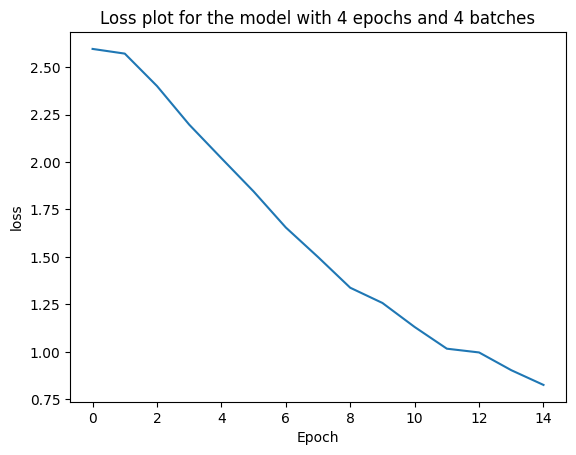

In [ ]:
sns.lineplot(tot_loss_1)
plt.xlabel('Epoch')
plt.ylabel("loss")
plt.title("Loss plot for the model with 4 epochs and 4 batches")
plt.show()

In [ ]:
#creating eval examples
examples = []
for text, annots in test_split:
  doc = nlp2.make_doc(text)
  example = Example.from_dict(doc, annots)
  examples.append(example)

In [ ]:
scorer = nlp2.evaluate(examples)
print(scorer)

{'token_acc': 1.0, 'token_p': 1.0, 'token_r': 1.0, 'token_f': 1.0, 'cats_score': 0.7303363530326622, 'cats_score_desc': 'macro F', 'cats_micro_p': 0.7409638554216867, 'cats_micro_r': 0.7409638554216867, 'cats_micro_f': 0.7409638554216867, 'cats_macro_p': 0.7355710337952843, 'cats_macro_r': 0.7339711388904907, 'cats_macro_f': 0.7303363530326622, 'cats_macro_auc': 0.9808388696626835, 'cats_f_per_type': {'online': {'p': 0.6885245901639344, 'r': 0.7241379310344828, 'f': 0.7058823529411765}, 'Grammar': {'p': 0.8148148148148148, 'r': 0.9705882352941176, 'f': 0.8859060402684563}, 'Search engines': {'p': 0.8405797101449275, 'r': 0.8656716417910447, 'f': 0.8529411764705882}, 'Design': {'p': 0.7291666666666666, 'r': 0.7142857142857143, 'f': 0.7216494845360826}, 'Navigation': {'p': 0.859375, 'r': 0.8870967741935484, 'f': 0.8730158730158729}, 'Dietary supplements': {'p': 0.8653846153846154, 'r': 0.8035714285714286, 'f': 0.8333333333333334}, 'Occupational safety and health': {'p': 0.75, 'r': 0.7636

In [ ]:
score_df = pd.DataFrame(scorer['cats_f_per_type'])
score_df

,online,Grammar,Search engines,Design,Navigation,Dietary supplements,Occupational safety and health,Epidemiology,Human Genetics,Oncology,...,Information science,International relations,Biotechnology,Control theory,Human–computer interaction,Surveillance,Environmental engineering,Materials science,Mechanical engineering,Systems engineering
p,0.688525,0.814815,0.840580,0.729167,0.859375,0.865385,0.750000,0.754717,0.529412,0.741935,...,0.600000,0.727273,0.733333,0.833333,0.595745,0.863636,0.865385,0.750000,0.683333,0.714286
r,0.724138,0.970588,0.865672,0.714286,0.887097,0.803571,0.763636,0.784314,0.837209,0.821429,...,0.568966,0.811594,0.400000,0.862069,0.571429,0.703704,0.762712,0.894737,0.745455,0.660377
f,0.705882,0.885906,0.852941,0.721649,0.873016,0.833333,0.756757,0.769231,0.648649,0.779661,...,0.584071,0.767123,0.517647,0.847458,0.583333,0.775510,0.810811,0.816000,0.713043,0.686275


In [ ]:
def find_marked_categories(cat_dict):
    marked_categories = [category for category, value in cat_dict['cats'].items() if value == 1]
    return marked_categories[0]


def predict_and_evaluate(model, test_data):
    correct_predictions = 0
    predictions = []
    y_true = []

    for text, true_labels in test_data:
        doc = model(text)
        true_label = find_marked_categories(true_labels)
        y_true.append(true_label)
        prediction = doc.cats
        highest_category = max(prediction, key=prediction.get)
        predictions.append(highest_category)
    return y_true, predictions

In [ ]:
y_true, y_pred = predict_and_evaluate(nlp2, test_split)

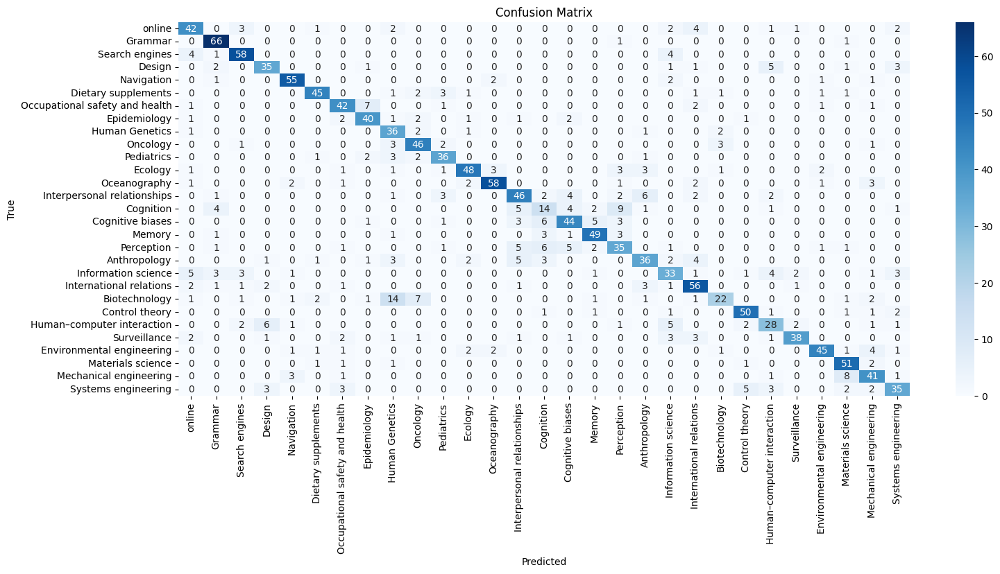

In [ ]:


cm = confusion_matrix(y_true, y_pred, labels=unique_labels)
fig = plt.figure(figsize=(17, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# Hyperparameter tuning for spacy

In [10]:
def nn_spacy(model, num_epochs, batch_size, data_train):
    if 'textcat_multilabel' not in model.pipe_names:
      textcat  =  model.add_pipe('textcat', last=True)
    else:
      textcat = model.get_pipe('textcat')
    for cat in unique_labels:
      textcat.add_label(cat)
    # Training the text categorization model
    optimizer = model.initialize()
    tot_loss = []
    for epoch in range(num_epochs):  # Number of training epochs
        losses = {}
        batches = minibatch(data_train, size=batch_size)
        for batch in batches:
            examples = [Example.from_dict(model.make_doc(text), annotations) for text, annotations in batch]
            model.update(examples, drop=0.5, losses=losses, sgd=optimizer)
        print(losses['textcat'])
        tot_loss.append(losses['textcat'])

    return tot_loss, model

In [11]:
### Using blank model because it did not work with the loaded model ####
epochs = [15,30]
batch_sizes = [50,100]
models = {}
for epoch in epochs:
  for batch_size in batch_sizes:
    print(f'Training model with {epoch} epochs and {batch_size} batch size')
    model = spacy.blank('en')
    models[f'epoch_{epoch}_batch_{batch_size}'] = {}
    tot_loss, model = nn_spacy(model, epoch, batch_size, train_split)
    models[f'epoch_{epoch}_batch_{batch_size}']['losses'] = tot_loss
    models[f'epoch_{epoch}_batch_{batch_size}']['model'] = model

Training model with 15 epochs and 50 batch size
2.5963540114462376
2.5542219281196594
2.4078530184924603
2.222691360861063
2.015176899731159
1.836050907149911
1.7079744040966034
1.5436776764690876
1.4541423227638006
1.3086631270125508
1.2135735163465142
1.122906818985939
1.02499430347234
0.9852591673843563
0.9153067776933312
Training model with 15 epochs and 100 batch size
1.297969289124012
1.2929163537919521
1.2599246893078089
1.2048086319118738
1.1358574721962214
1.069052690640092
0.9965780414640903
0.9266971424221992
0.8629923928529024
0.8203247264027596
0.7569661028683186
0.7176604205742478
0.6810766849666834
0.638026550412178
0.6104020588099957
Training model with 30 epochs and 50 batch size
2.596453692764044
2.557920917868614
2.3598659336566925
2.119166800752282
1.9435549136251211
1.8102186378091574
1.665679574944079
1.5332265561446548
1.432628477923572
1.3231307212263346
1.2399315042421222
1.140187636949122
1.0440662503242493
0.9872162900865078
0.9049638365395367
0.8500663596205

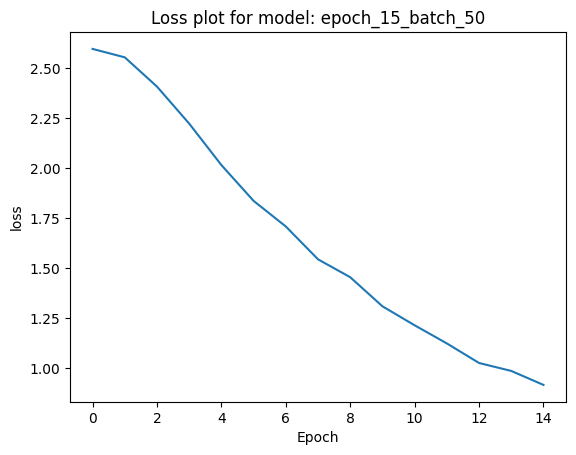

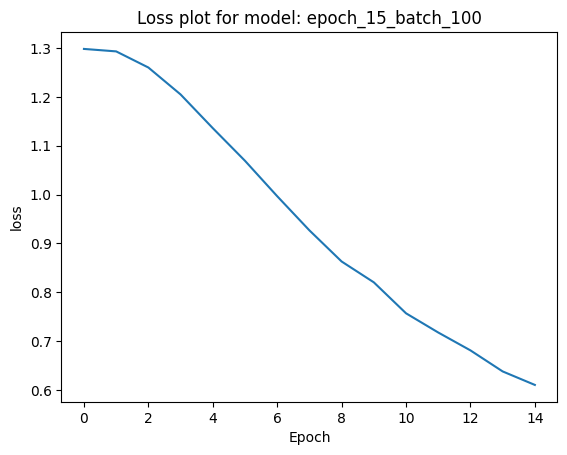

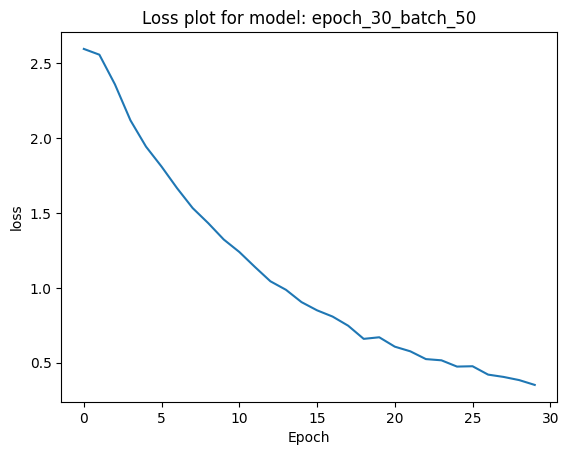

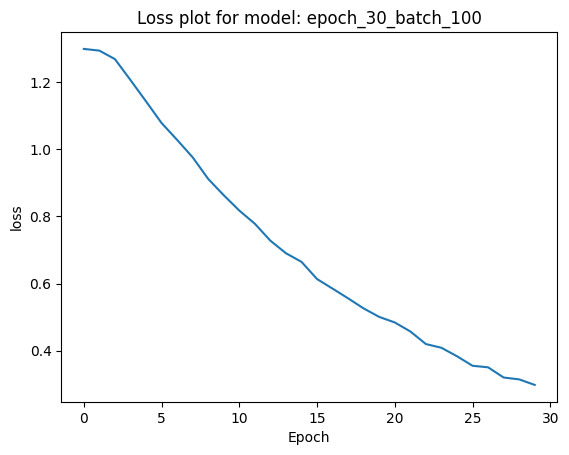

In [12]:
for model in models.keys():
  sns.lineplot(models[model]['losses'])
  plt.xlabel('Epoch')
  plt.ylabel("loss")
  plt.title("Loss plot for model: {}".format(model))
  plt.show()

In [13]:
def find_marked_categories(cat_dict):
    marked_categories = [category for category, value in cat_dict['cats'].items() if value == 1]
    return marked_categories[0]


def predict_and_evaluate(model, test_data):
    correct_predictions = 0
    predictions = []
    y_true = []

    for text, true_labels in test_data:
        doc = model(text)
        true_label = find_marked_categories(true_labels)
        y_true.append(true_label)
        prediction = doc.cats
        highest_category = max(prediction, key=prediction.get)
        predictions.append(highest_category)
    return y_true, predictions

data for the model: epoch_15_batch_50
scorer:
 {'token_acc': 1.0, 'token_p': 1.0, 'token_r': 1.0, 'token_f': 1.0, 'cats_score': 0.7291913415987948, 'cats_score_desc': 'macro F', 'cats_micro_p': 0.7367469879518073, 'cats_micro_r': 0.7367469879518073, 'cats_micro_f': 0.7367469879518072, 'cats_macro_p': 0.7382052065335837, 'cats_macro_r': 0.7323490453628898, 'cats_macro_f': 0.7291913415987948, 'cats_macro_auc': 0.9829682672534663, 'cats_f_per_type': {'online': {'p': 0.7142857142857143, 'r': 0.7432432432432432, 'f': 0.7284768211920529}, 'Grammar': {'p': 0.8421052631578947, 'r': 0.96, 'f': 0.8971962616822429}, 'Search engines': {'p': 0.8656716417910447, 'r': 0.9206349206349206, 'f': 0.8923076923076922}, 'Design': {'p': 0.7142857142857143, 'r': 0.7446808510638298, 'f': 0.7291666666666666}, 'Navigation': {'p': 0.8484848484848485, 'r': 0.8484848484848485, 'f': 0.8484848484848486}, 'Dietary supplements': {'p': 0.9107142857142857, 'r': 0.8225806451612904, 'f': 0.864406779661017}, 'Occupational s

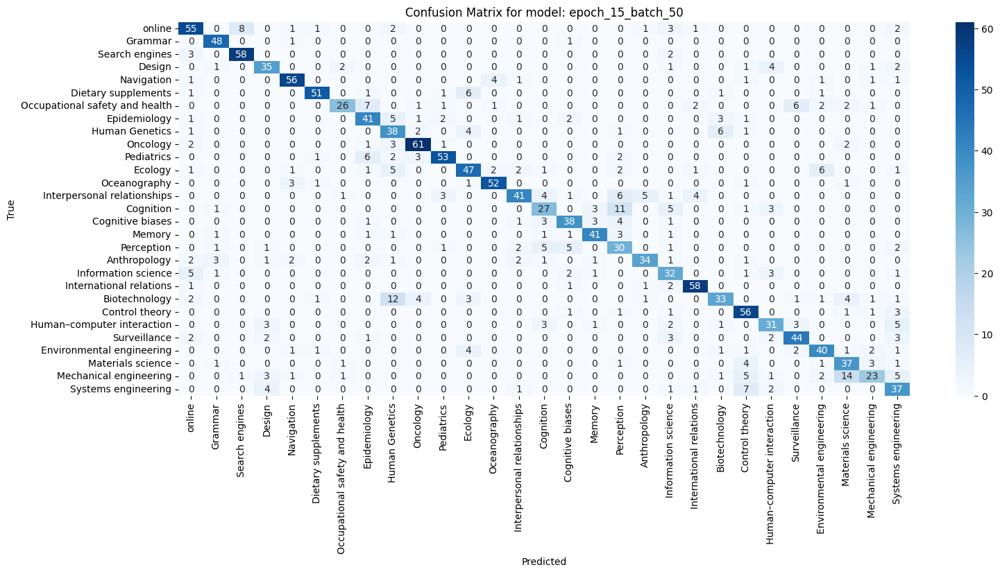

data for the model: epoch_15_batch_100
scorer:
 {'token_acc': 1.0, 'token_p': 1.0, 'token_r': 1.0, 'token_f': 1.0, 'cats_score': 0.6959370275775045, 'cats_score_desc': 'macro F', 'cats_micro_p': 0.7054216867469879, 'cats_micro_r': 0.7054216867469879, 'cats_micro_f': 0.7054216867469879, 'cats_macro_p': 0.7101425063614786, 'cats_macro_r': 0.698202864038749, 'cats_macro_f': 0.6959370275775045, 'cats_macro_auc': 0.9782767688296362, 'cats_f_per_type': {'online': {'p': 0.78125, 'r': 0.6756756756756757, 'f': 0.7246376811594203}, 'Grammar': {'p': 0.8703703703703703, 'r': 0.94, 'f': 0.9038461538461539}, 'Search engines': {'p': 0.8923076923076924, 'r': 0.9206349206349206, 'f': 0.90625}, 'Design': {'p': 0.6111111111111112, 'r': 0.7021276595744681, 'f': 0.6534653465346535}, 'Navigation': {'p': 0.9019607843137255, 'r': 0.696969696969697, 'f': 0.7863247863247863}, 'Dietary supplements': {'p': 0.9285714285714286, 'r': 0.8387096774193549, 'f': 0.8813559322033899}, 'Occupational safety and health': {'p

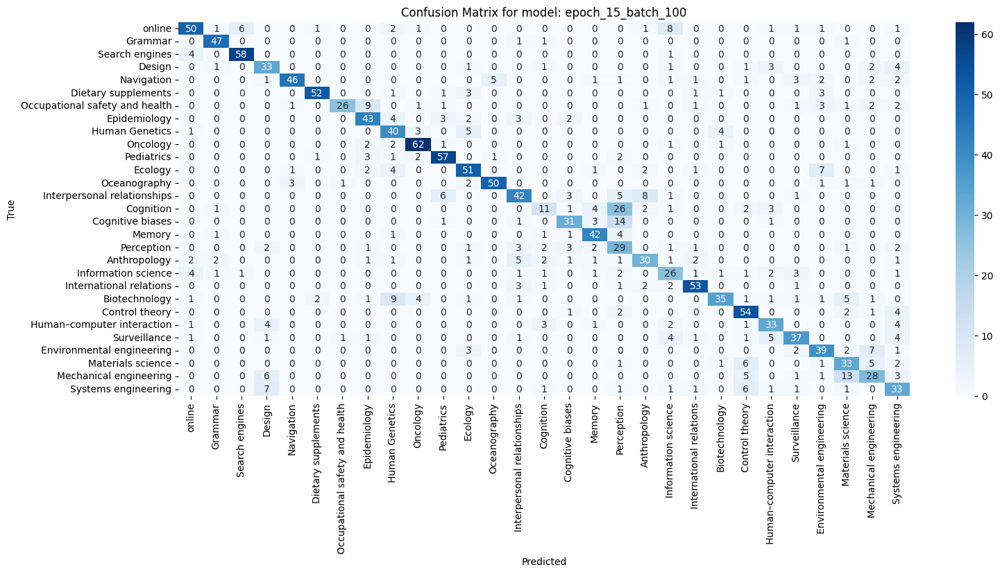

data for the model: epoch_30_batch_50
scorer:
 {'token_acc': 1.0, 'token_p': 1.0, 'token_r': 1.0, 'token_f': 1.0, 'cats_score': 0.7348324205284689, 'cats_score_desc': 'macro F', 'cats_micro_p': 0.7385542168674699, 'cats_micro_r': 0.7385542168674699, 'cats_micro_f': 0.7385542168674699, 'cats_macro_p': 0.7466952465257317, 'cats_macro_r': 0.737160067273958, 'cats_macro_f': 0.7348324205284689, 'cats_macro_auc': 0.9818203057131105, 'cats_f_per_type': {'online': {'p': 0.7777777777777778, 'r': 0.6621621621621622, 'f': 0.7153284671532847}, 'Grammar': {'p': 0.92, 'r': 0.92, 'f': 0.92}, 'Search engines': {'p': 0.9298245614035088, 'r': 0.8412698412698413, 'f': 0.8833333333333334}, 'Design': {'p': 0.5737704918032787, 'r': 0.7446808510638298, 'f': 0.6481481481481481}, 'Navigation': {'p': 0.8852459016393442, 'r': 0.8181818181818182, 'f': 0.8503937007874016}, 'Dietary supplements': {'p': 0.9107142857142857, 'r': 0.8225806451612904, 'f': 0.864406779661017}, 'Occupational safety and health': {'p': 0.93

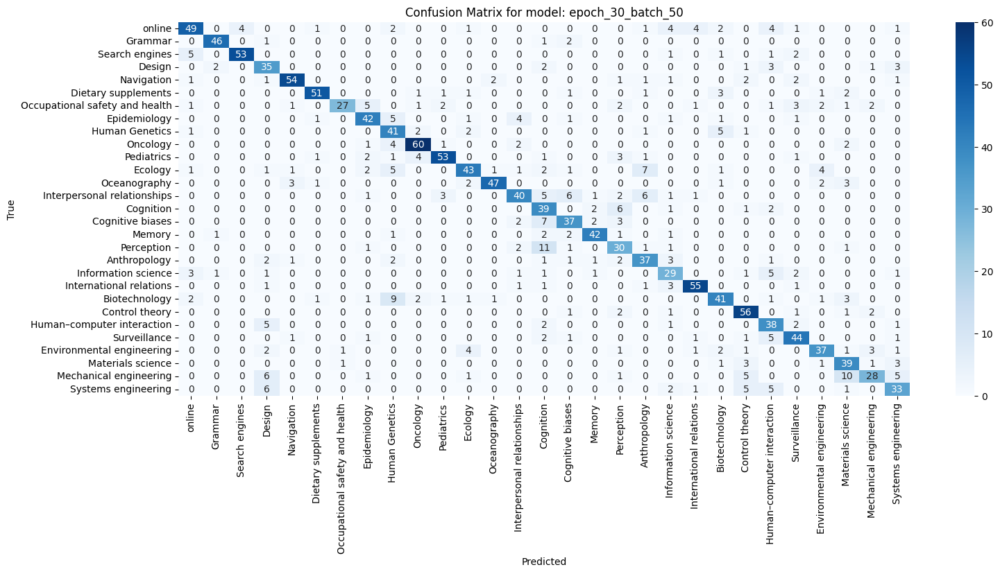

data for the model: epoch_30_batch_100
scorer:
 {'token_acc': 1.0, 'token_p': 1.0, 'token_r': 1.0, 'token_f': 1.0, 'cats_score': 0.7505657097353333, 'cats_score_desc': 'macro F', 'cats_micro_p': 0.7572289156626506, 'cats_micro_r': 0.7572289156626506, 'cats_micro_f': 0.7572289156626506, 'cats_macro_p': 0.7550236009445338, 'cats_macro_r': 0.7532592860926172, 'cats_macro_f': 0.7505657097353333, 'cats_macro_auc': 0.9840340594161628, 'cats_f_per_type': {'online': {'p': 0.8333333333333334, 'r': 0.7432432432432432, 'f': 0.7857142857142858}, 'Grammar': {'p': 0.9038461538461539, 'r': 0.94, 'f': 0.9215686274509804}, 'Search engines': {'p': 0.9166666666666666, 'r': 0.873015873015873, 'f': 0.894308943089431}, 'Design': {'p': 0.72, 'r': 0.7659574468085106, 'f': 0.7422680412371133}, 'Navigation': {'p': 0.8636363636363636, 'r': 0.8636363636363636, 'f': 0.8636363636363636}, 'Dietary supplements': {'p': 0.9433962264150944, 'r': 0.8064516129032258, 'f': 0.8695652173913043}, 'Occupational safety and heal

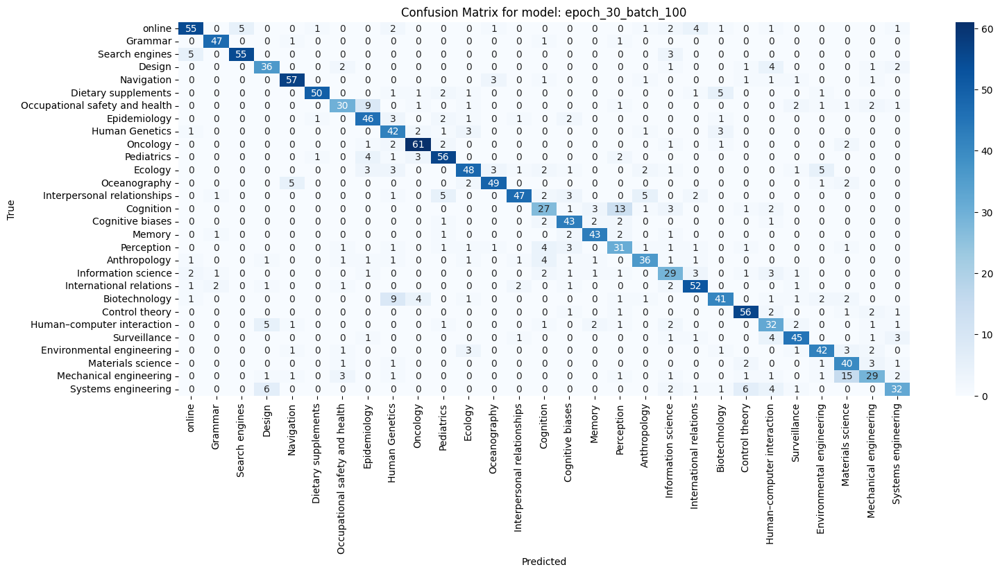

In [15]:
#creating eval examples
for model in models.keys():

  examples = []
  for text, annots in test_split:
    doc = models[model]['model'].make_doc(text)
    example = Example.from_dict(doc, annots)
    examples.append(example)

  scorer = models[model]['model'].evaluate(examples)
  print("data for the model: {}".format(model))
  print("scorer:\n", scorer)
  score_df = pd.DataFrame(scorer['cats_f_per_type'])
  models[model]['score_df'] = score_df
  print("percision, recall, F score for model: {} per category\n{}".format(model,scorer['cats_f_per_type']))
  y_true, y_pred = predict_and_evaluate(models[model]['model'], test_split)
  cm = confusion_matrix(y_true, y_pred, labels=unique_labels)
  fig = plt.figure(figsize=(17, 7))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title('Confusion Matrix for model: {}'.format(model))
  plt.show()

# Building a nueral network classifier

In [ ]:
unique_labels = data['Category'].unique()

data['cats'] = data['Category'].apply(lambda x: [1 if x == cat else 0 for cat in unique_labels] )
data

<ipython-input-6-40c472fec612>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cats'] = data['Category'].apply(lambda x: [1 if x == cat else 0 for cat in unique_labels] )


,Category,Topic,Link,paragraphs,text_length,clean text,ents,cats
0,online,List of online databases,https://en.wikipedia.org/wiki/List_of_online_d...,\n This is a list of online databases accessib...,66,list online database accessible internet,NaN,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,online,Online database,https://en.wikipedia.org/wiki/Online_database,An online database is a database accessible fr...,1154,online database database accessible local netw...,monthly lamar smith,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,online,AgBiotechNet,https://en.wikipedia.org/wiki/AgBiotechNet,AgBiotechNet is a searchable online database o...,631,agbiotechnet searchable online database scient...,agbiotechnet january michigan state university,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,online,Airliners.net,https://en.wikipedia.org/wiki/Airliners.net,"Airliners.net is a Canadian-owned, Australian-...",3602,canadian own australian global aviation websit...,canadian australian swedish swede johan lundgr...,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,online,American Council of Learned Societies,https://en.wikipedia.org/wiki/American_Council...,\n The American Council of Learned Societies (...,9920,american council learn society acls private no...,acls social sciences united states union acadé...,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...,...,...,...
5529,Systems engineering,Technical peer review,https://en.wikipedia.org/wiki/Technical_peer_r...,"In engineering, technical peer review is a wel...",3032,engineering technical peer review define revie...,cmmi,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5530,Systems engineering,Teleforce,https://en.wikipedia.org/wiki/Teleforce,Teleforce is a proposed defensive weapon by Ni...,6306,teleforce propose defensive weapon nikola tesl...,teleforce nikola van de graaff teleforce trill...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5531,Systems engineering,Terraform (software),https://en.wikipedia.org/wiki/Terraform_(softw...,\n Terraform is an infrastructure-as-code soft...,2455,terraform infrastructure code software tool cr...,hashicorp hashicorp configuration language hcl...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5532,Systems engineering,Test and evaluation master plan,https://en.wikipedia.org/wiki/Test_and_evaluat...,Test and evaluation master plan (TEMP) is a cr...,4515,test evaluation master plan temp critical aspe...,moe square meter moes australian department,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
#preparing data to match nn model structure
#using BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(data['clean text'])
y = data['cats']

In [ ]:
print(X.shape)
print(y.shape)


(5533, 90505)
(5533,)


In [ ]:
X_train, X_test = train_test_split(X, test_size=0.3, random_state=42)
y_train, y_test = train_test_split(y, test_size=0.3, random_state=42)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(3873, 90505)
(3873,)
(1660, 90505)
(1660,)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.functional import F


In [ ]:
class TextClassifier(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TextClassifier, self).__init__()

        self.fc1 = nn.Linear(input_dim, 500)
        self.fc2 = nn.Linear(500, 100)
        self.fc3 = nn.Linear(100, output_dim)

    def forward(self, x):
      x = F.relu(self.fc1(x))
      x = F.relu(self.fc2(x))
      x = self.fc3(x)
      return x

In [ ]:
clf_nn = TextClassifier(90505,29)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(clf_nn.parameters(), lr=0.001)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
clf_nn.to(device)

TextClassifier(
  (fc1): Linear(in_features=90505, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=100, bias=True)
  (fc3): Linear(in_features=100, out_features=29, bias=True)
)

In [ ]:
epochs = 15
batch_size = 1000
num_batches = X_train.shape[0] // batch_size
losses =[]
for epoch in range(epochs):
  for i in range(0, X_train.shape[0], batch_size):
    if i + batch_size > X_train.shape[0]:
      X_batch = torch.tensor(X_train[i:X_train.shape[0]].toarray(), dtype=torch.float32).to(device)
      y_batch = torch.tensor(y_train[i:X_train.shape[0]].values.tolist(),dtype=torch.float32).to(device)
    else:
      X_batch = torch.tensor(X_train[i:i+batch_size].toarray(), dtype=torch.float32).to(device)
      y_batch = torch.tensor(y_train[i:i+batch_size].values.tolist(),dtype=torch.float32).to(device)
    out = clf_nn(X_batch)
    loss = criterion(out, y_batch)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    losses.append(loss.to('cpu').item())
  print(f'Epoch: {epoch+1}, Loss: {loss.to("cpu").item()}')

Epoch: 1, Loss: 2.685014486312866
Epoch: 2, Loss: 1.6365306377410889
Epoch: 3, Loss: 0.9948496222496033
Epoch: 4, Loss: 0.6078729629516602
Epoch: 5, Loss: 0.38238775730133057
Epoch: 6, Loss: 0.2455630600452423
Epoch: 7, Loss: 0.16709353029727936
Epoch: 8, Loss: 0.12045449763536453
Epoch: 9, Loss: 0.09112788736820221
Epoch: 10, Loss: 0.07148309797048569
Epoch: 11, Loss: 0.05768338218331337
Epoch: 12, Loss: 0.047744020819664
Epoch: 13, Loss: 0.0404915027320385
Epoch: 14, Loss: 0.03512907773256302
Epoch: 15, Loss: 0.03111356869339943


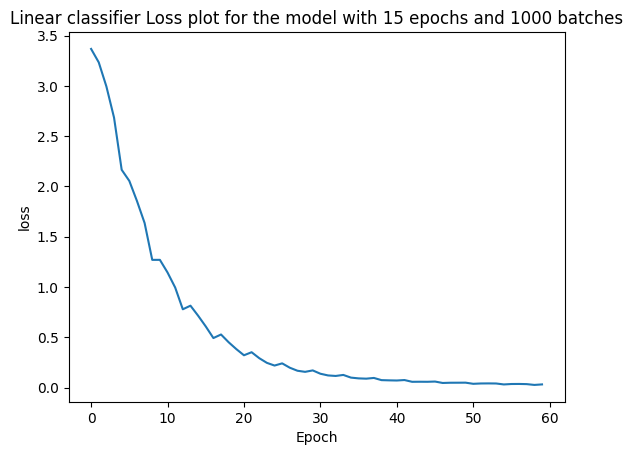

In [ ]:
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel("loss")
plt.title("Linear classifier Loss plot for the model with 15 epochs and 1000 batches")
plt.show()

In [ ]:
outs = clf_nn(torch.tensor(X_test.toarray(), dtype=torch.float32).to(device))
_, preds = torch.max(outs.data,1)


In [ ]:
y_true_test = torch.tensor(y_test.values.tolist())
_, y_true_test = torch.max(y_true_test.data,1)
y_true_test

tensor([17, 25,  9,  ..., 25, 20,  8])

In [ ]:
unique_labels=data['Category'].unique()
unique_labels

array(['online', 'Grammar', 'Search engines', 'Design', 'Navigation',
       'Dietary supplements', 'Occupational safety and health',
       'Epidemiology', 'Human Genetics', 'Oncology', 'Pediatrics',
       'Ecology', 'Oceanography', 'Interpersonal relationships',
       'Cognition', 'Cognitive biases', 'Memory', 'Perception',
       'Anthropology', 'Information science', 'International relations',
       'Biotechnology', 'Control theory', 'Human–computer interaction',
       'Surveillance', 'Environmental engineering', 'Materials science',
       'Mechanical engineering', 'Systems engineering'], dtype=object)

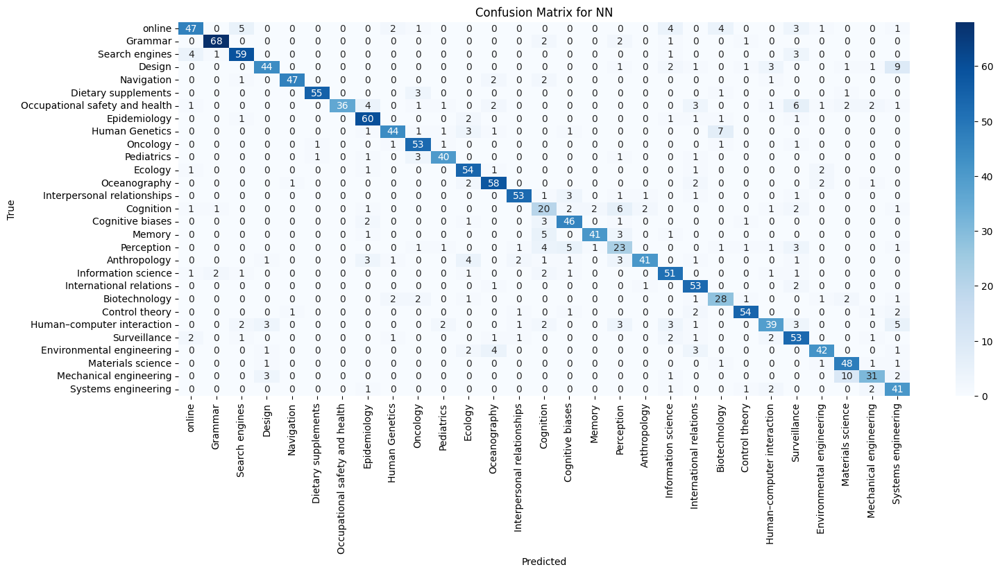

In [ ]:
cm_nn = confusion_matrix(y_true_test, preds.cpu().numpy())
fig = plt.figure(figsize=(17, 7))
sns.heatmap(cm_nn, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for NN')
plt.show()

# Hyper parameters tuning

* epochs
* learning rate

In [ ]:
epochs = [10,20,30]
learning_rates = [0.01,0.001,0.0001]
nn_models_dict = {}
#this will have model and its losses so 'model':{'model_net':, 'losses':}
for epoch in epochs:
  for lr in learning_rates:
    nn_models_dict[f'nn_epoch_{epoch}_lr_{lr}'] = {}

In [ ]:
nn_models_dict

{'nn_epoch_10_lr_0.01': {},
 'nn_epoch_10_lr_0.001': {},
 'nn_epoch_10_lr_0.0001': {},
 'nn_epoch_20_lr_0.01': {},
 'nn_epoch_20_lr_0.001': {},
 'nn_epoch_20_lr_0.0001': {},
 'nn_epoch_30_lr_0.01': {},
 'nn_epoch_30_lr_0.001': {},
 'nn_epoch_30_lr_0.0001': {}}

In [ ]:
def train_loop(model, epochs, batch_size, X_train, y_train, optimizer, losses):
  for epoch in range(epochs):
    for i in range(0, X_train.shape[0], batch_size):
      if i + batch_size > X_train.shape[0]:
        X_batch = torch.tensor(X_train[i:X_train.shape[0]].toarray(), dtype=torch.float32).to(device)
        y_batch = torch.tensor(y_train[i:X_train.shape[0]].values.tolist(),dtype=torch.float32).to(device)
      else:
        X_batch = torch.tensor(X_train[i:i+batch_size].toarray(), dtype=torch.float32).to(device)
        y_batch = torch.tensor(y_train[i:i+batch_size].values.tolist(),dtype=torch.float32).to(device)
      out = clf_nn(X_batch)
      loss = criterion(out, y_batch)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      losses.append(loss.to('cpu').item())
    print(f'Epoch: {epoch+1}, Loss: {loss.to("cpu").item()}')

In [ ]:
for epoch in epochs:
  for lr in learning_rates:
    clf_nn = TextClassifier(90505,29)
    criterion = nn.CrossEntropyLoss()
    nn_models_dict[f"nn_epoch_{epoch}_lr_{lr}"]['losses'] = []
    print(f'Training model with {epoch} epochs and {lr} learning rate')
    optimizer = optim.Adam(clf_nn.parameters(), lr=lr)
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    clf_nn.to(device)
    train_loop(clf_nn, epochs=epoch, batch_size=1000, X_train=X_train, y_train=y_train, optimizer=optimizer, losses=nn_models_dict[f"nn_epoch_{epoch}_lr_{lr}"]['losses'])
    nn_models_dict[f"nn_epoch_{epoch}_lr_{lr}"]['model'] = clf_nn

Training model with 10 epochs and 0.01 learning rate
Epoch: 1, Loss: 3.1946048736572266
Epoch: 2, Loss: 1.2130115032196045
Epoch: 3, Loss: 0.46770521998405457
Epoch: 4, Loss: 0.15952542424201965
Epoch: 5, Loss: 0.07567161321640015
Epoch: 6, Loss: 0.03529501333832741
Epoch: 7, Loss: 0.014137002639472485
Epoch: 8, Loss: 0.028710894286632538
Epoch: 9, Loss: 0.02298032119870186
Epoch: 10, Loss: 0.00518203666433692
Training model with 10 epochs and 0.001 learning rate
Epoch: 1, Loss: 2.7067151069641113
Epoch: 2, Loss: 1.6846495866775513
Epoch: 3, Loss: 1.0343023538589478
Epoch: 4, Loss: 0.6400148272514343
Epoch: 5, Loss: 0.40139251947402954
Epoch: 6, Loss: 0.2602066099643707
Epoch: 7, Loss: 0.17786163091659546
Epoch: 8, Loss: 0.12715540826320648
Epoch: 9, Loss: 0.09508220106363297
Epoch: 10, Loss: 0.07379723340272903
Training model with 10 epochs and 0.0001 learning rate
Epoch: 1, Loss: 3.3147380352020264
Epoch: 2, Loss: 3.1601548194885254
Epoch: 3, Loss: 2.9661526679992676
Epoch: 4, Loss: 

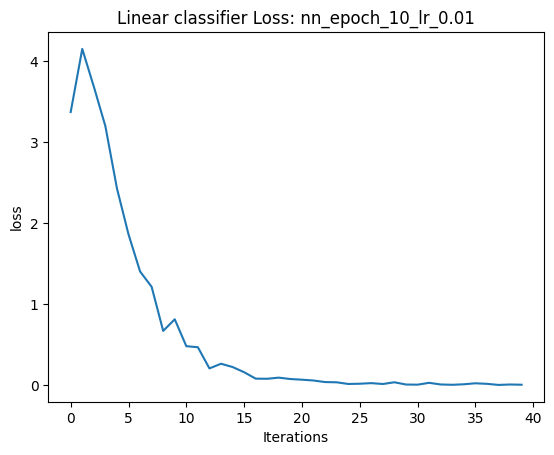

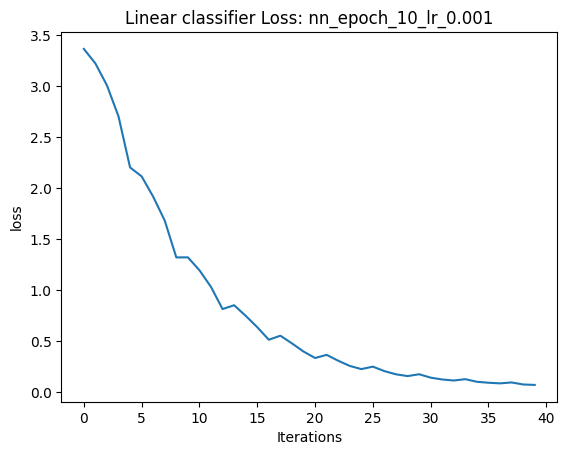

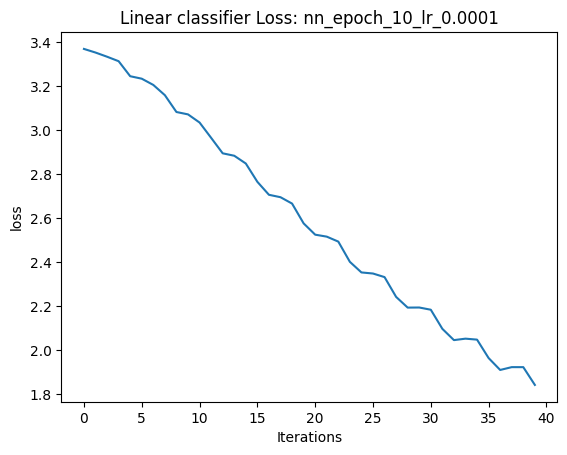

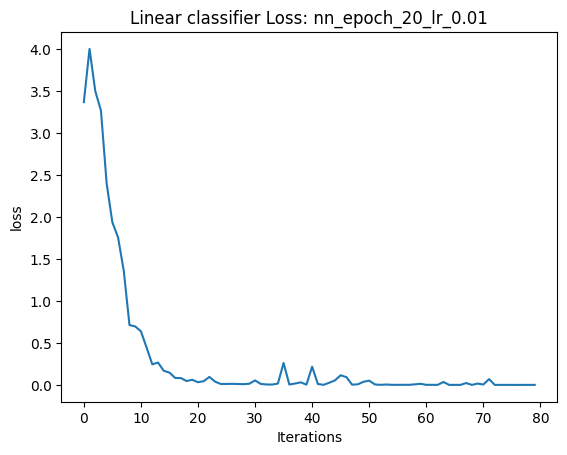

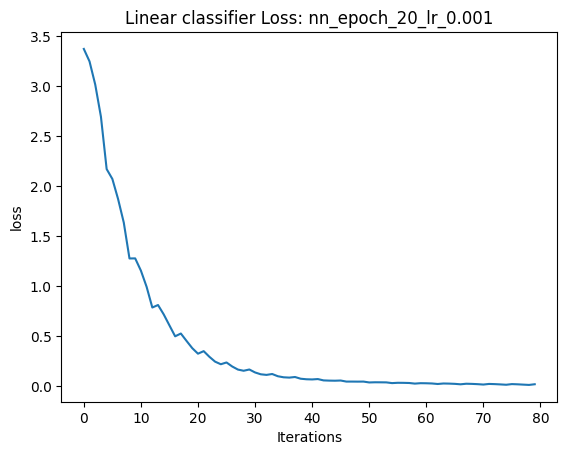

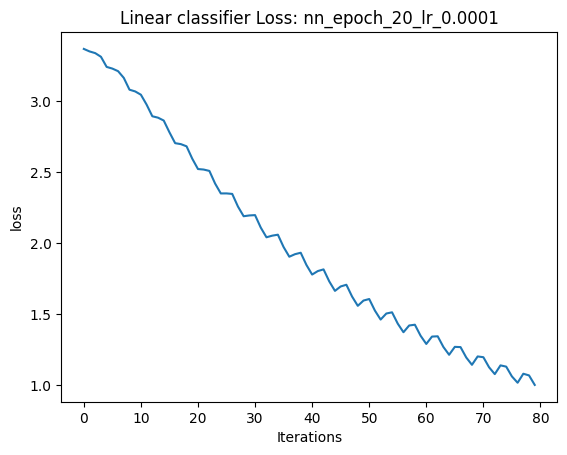

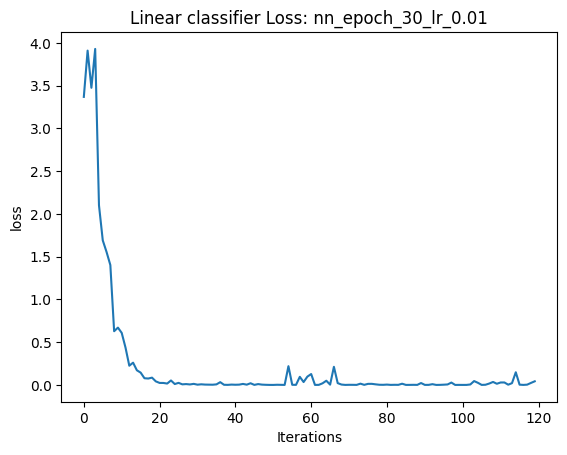

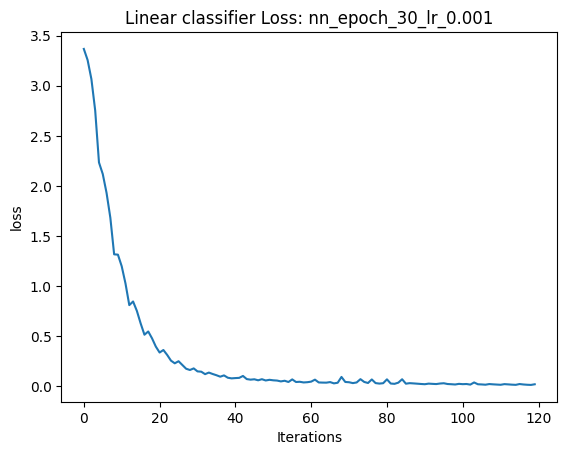

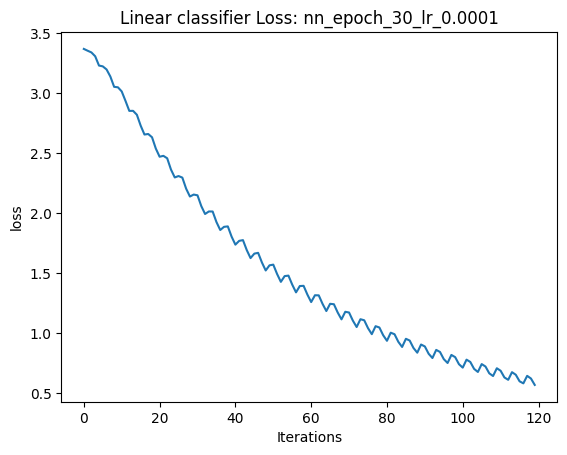

In [ ]:
for key in nn_models_dict.keys():
  plt.plot(nn_models_dict[key]['losses'])
  plt.xlabel('Iterations')
  plt.ylabel("loss")
  plt.title("Linear classifier Loss: {}".format(key))
  plt.show()

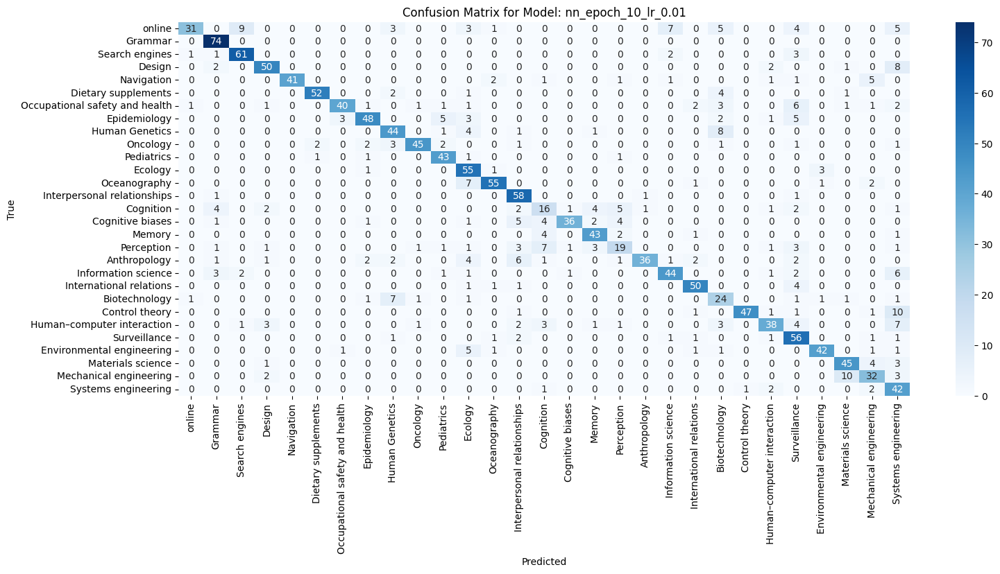

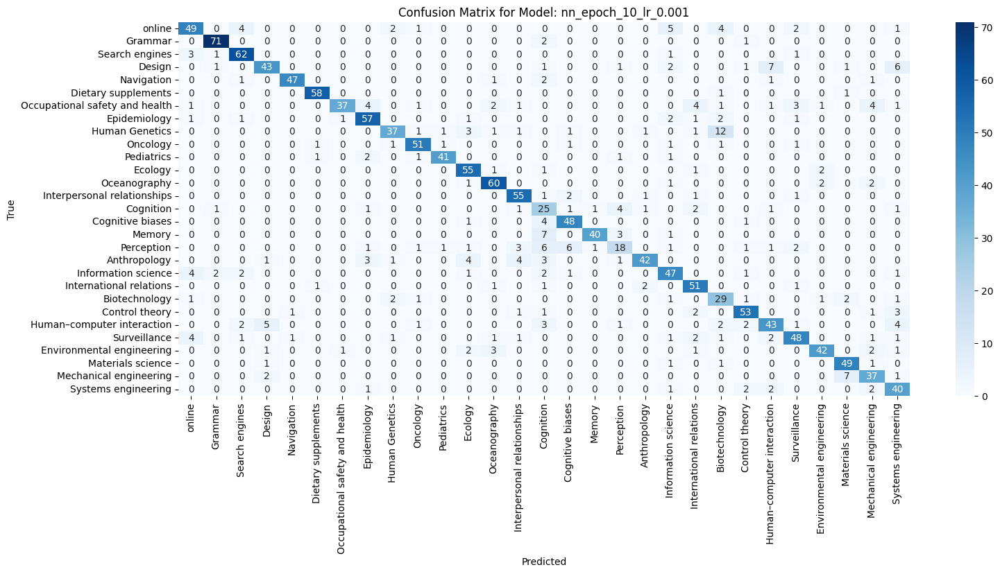

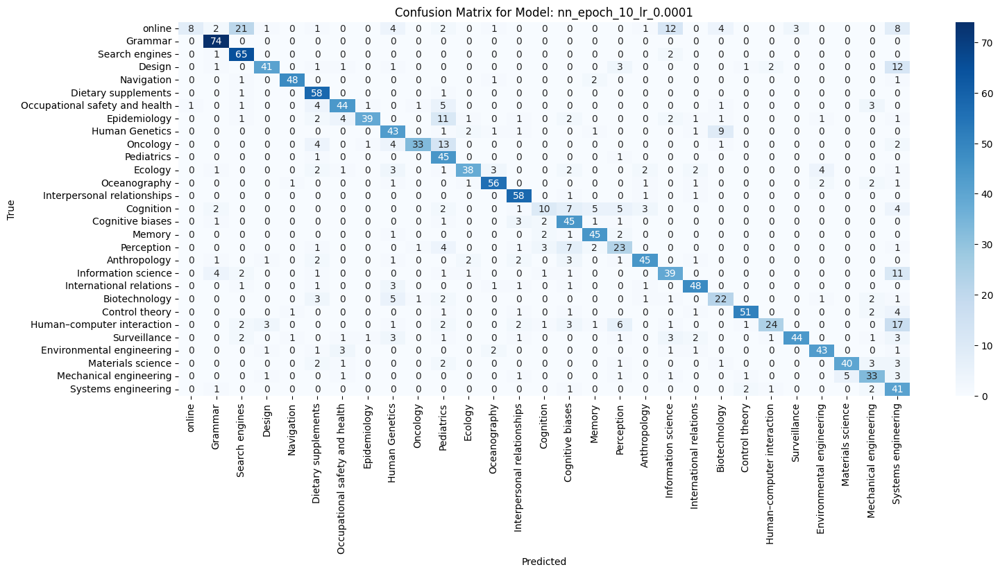

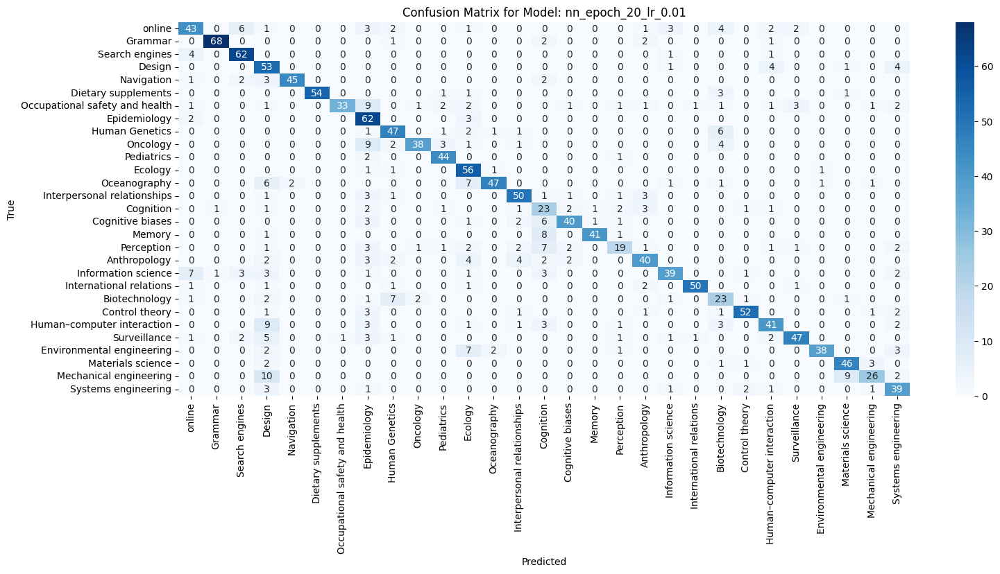

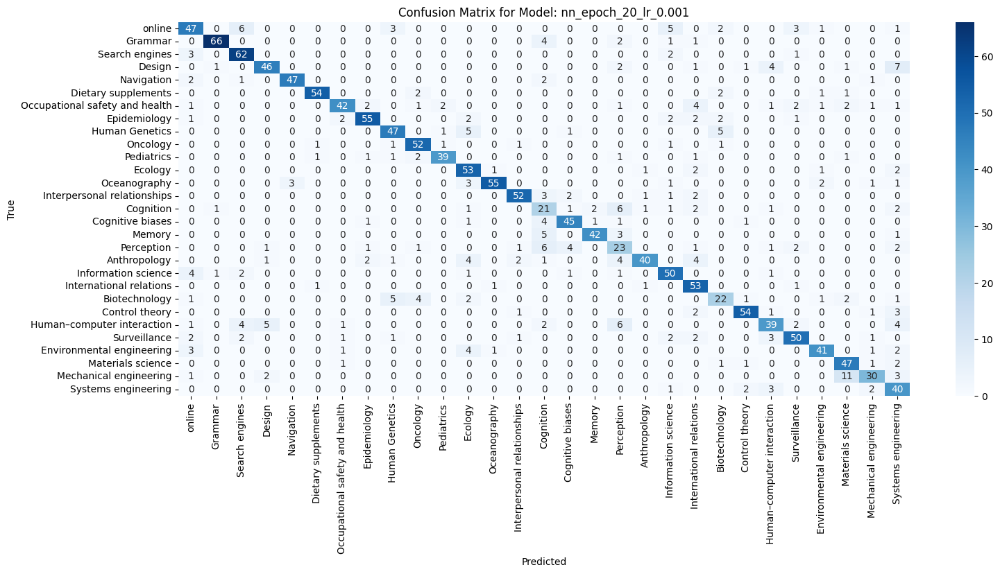

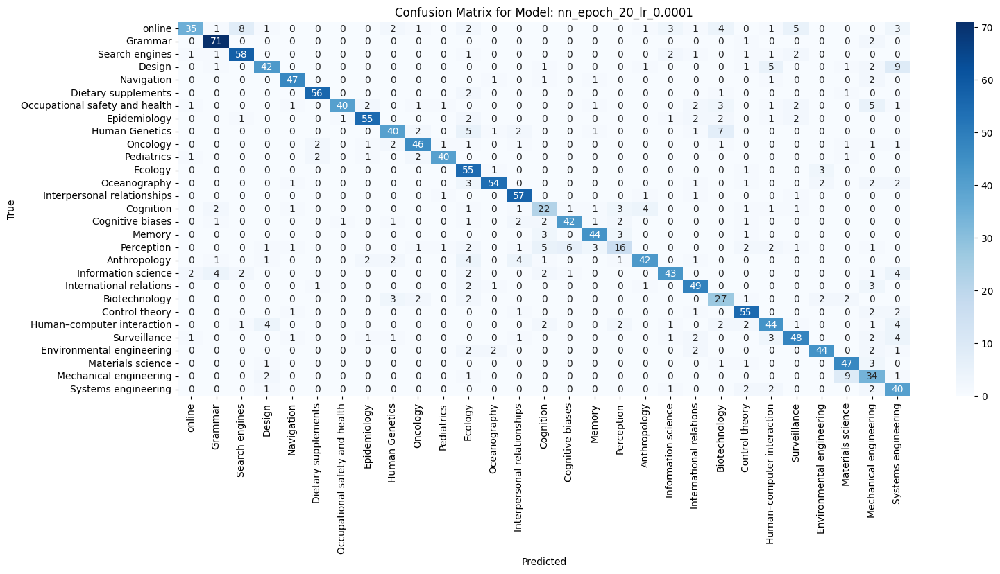

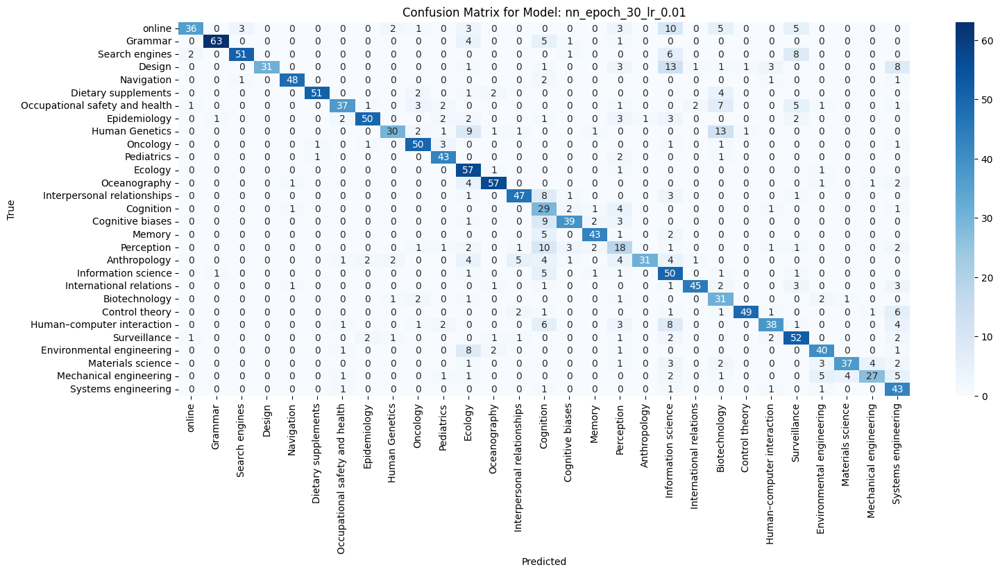

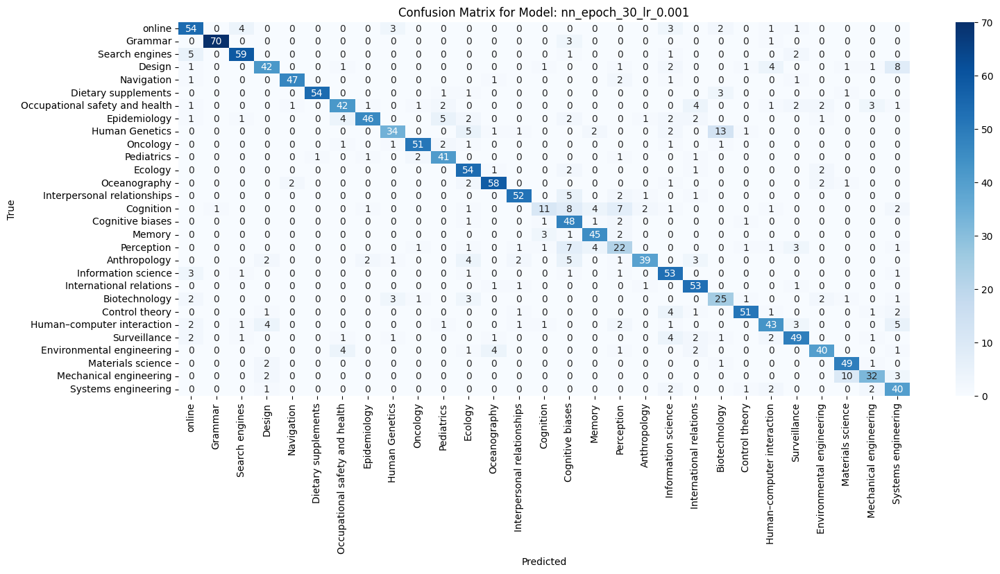

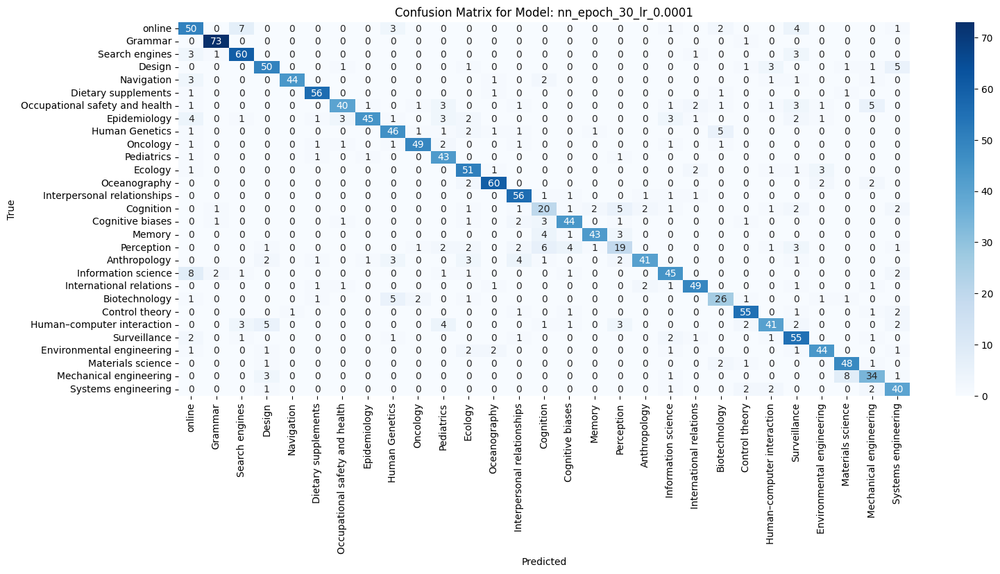

In [ ]:
for key in nn_models_dict.keys():
  outs = nn_models_dict[key]['model'](torch.tensor(X_test.toarray(), dtype=torch.float32).to(device))
  _, preds = torch.max(outs.data,1)
  y_true_test = torch.tensor(y_test.values.tolist())
  _, y_true_test = torch.max(y_true_test.data,1)
  y_true_test
  cm_nn = confusion_matrix(y_true_test, preds.cpu().numpy())
  fig = plt.figure(figsize=(17, 7))
  sns.heatmap(cm_nn, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title('Confusion Matrix for Model: {}'.format(key))
  plt.show()

In [ ]:
TPs = {}
for key in nn_models_dict.keys():
  outs = nn_models_dict[key]['model'](torch.tensor(X_test.toarray(), dtype=torch.float32).to(device))
  _, preds = torch.max(outs.data,1)
  y_true_test = torch.tensor(y_test.values.tolist())
  _, y_true_test = torch.max(y_true_test.data,1)
  y_true_test
  cm_nn = confusion_matrix(y_true_test, preds.cpu().numpy())
  diag = cm_nn.diagonal()
  TPs[key] = diag


In [ ]:
vals = []
models = []
categories = []
for key in TPs.keys():
  for i, val in enumerate(TPs[key]):
    vals.append(val)
    models.append(key)
    categories.append(unique_labels[i])

In [ ]:
true_y_df = pd.DataFrame(y_true_test)
true_y_df.columns = ['cat']
counts = true_y_df.value_counts().sort_index()

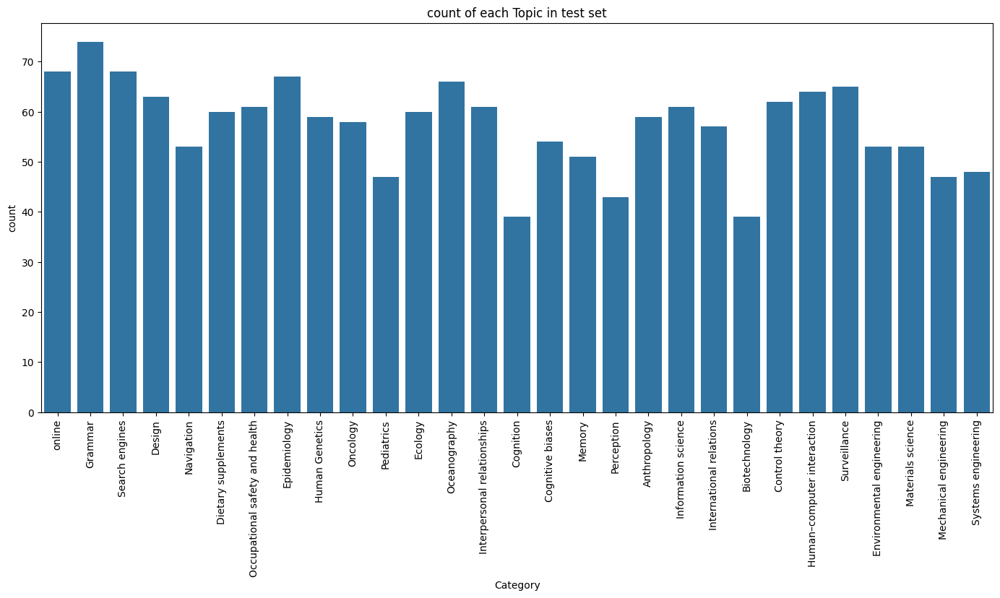

In [ ]:
plt.figure(figsize=(17, 7))
sns.barplot(x=unique_labels, y=counts, dodge=True)
plt.xticks(rotation=90)
plt.title("count of each Topic in test set")
plt.xlabel('Category')
plt.show()

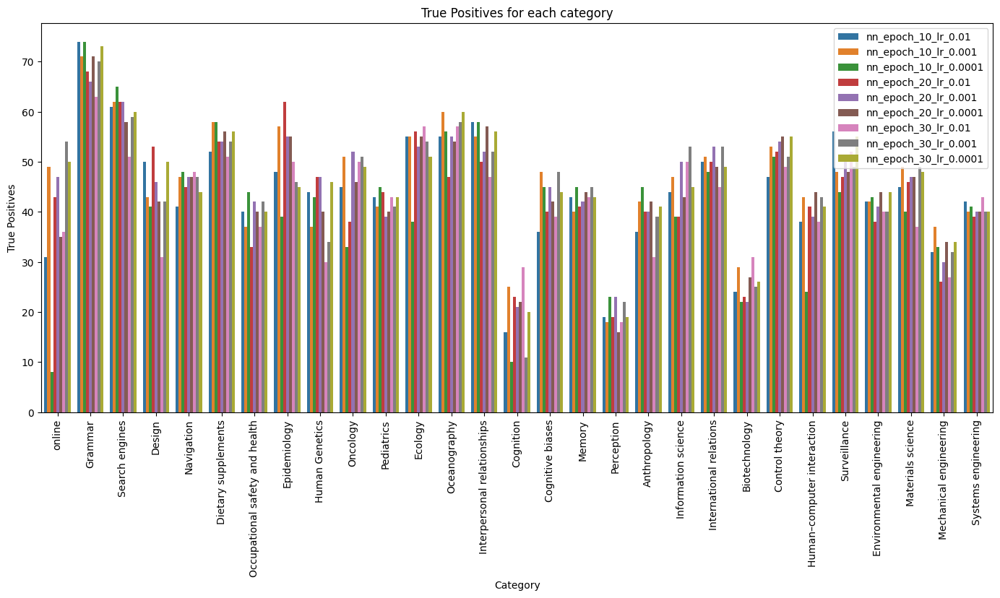

In [ ]:
plt.figure(figsize=(17, 7))
sns.barplot(x=categories, y=vals,hue=models, dodge=True)
plt.xlabel('Category')
plt.ylabel('True Positives')
plt.xticks(rotation=90)
plt.title('True Positives for each category')
plt.show()